In [36]:
# Preliminaries
library(mlr)      # ML library
library(OpenML)   # ML datasets, models, sharing

# Plotting
library(ggplot2)  
library(cowplot)

# Instance-Based Learning

- If you have no time to learn, but have lots of examples, what do you do?
    - E.g. Frank Abagnale Jr. posing as a doctor
- Long history on learning by analogy 

Nearest neighbour algorithm
- Simplest and fastest learning algorithm of all time (0 training time)
- Delaying learning is sometimes really beneficial
    - E.g. Facebook imports 300,000,000 images a day

#### Nearest Neighbor
- Given query instance $x_q$, first locate nearest training example $X_n$, then estimate $\hat{f}(x_q) = f(x_n)$

#### k-Nearest Neighbor
- Classification: Given $x_q$, take vote among its $k$ nearest neighbors
- Regression: Take mean of $f$ values of $k$ nearest neighbors


## Voronoi Diagram
- Voronoi cell of $x \in S$: all points closer to x than any other in S
- Region of class C: Union of Voronoi cells of instances of C in S

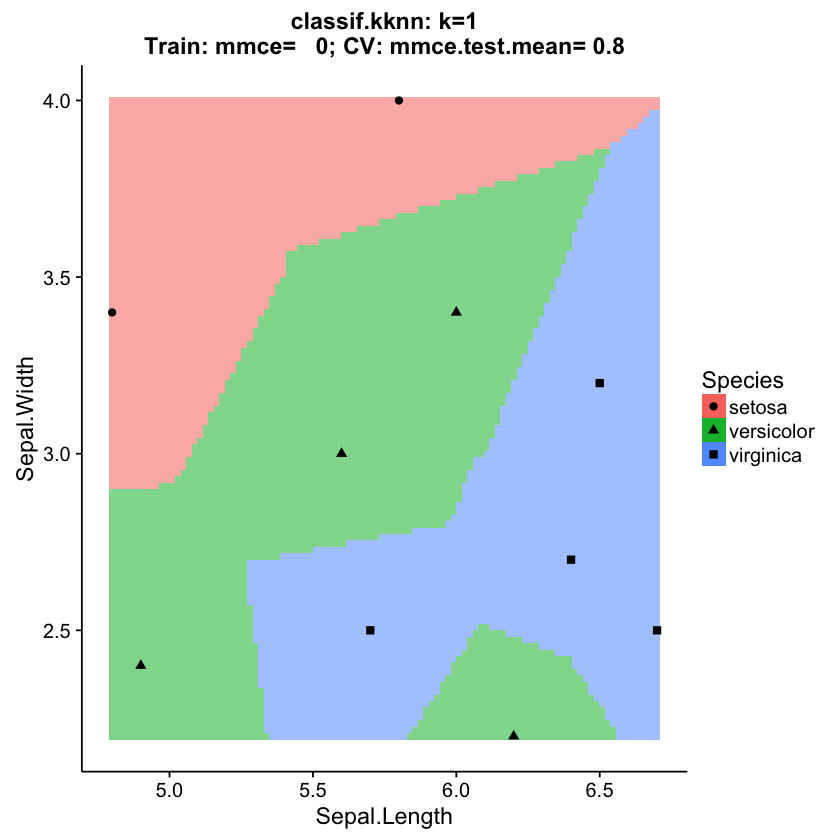

In [55]:
data(iris, package = "datasets")
iris_small = iris[sample(nrow(iris), 10), ]
task_small = makeClassifTask(data = iris_small, target = "Species")
lrn = makeLearner("classif.kknn", k = 1)
plotLearnerPrediction(lrn, task_small, features = c("Sepal.Length", "Sepal.Width")) + theme_cowplot()

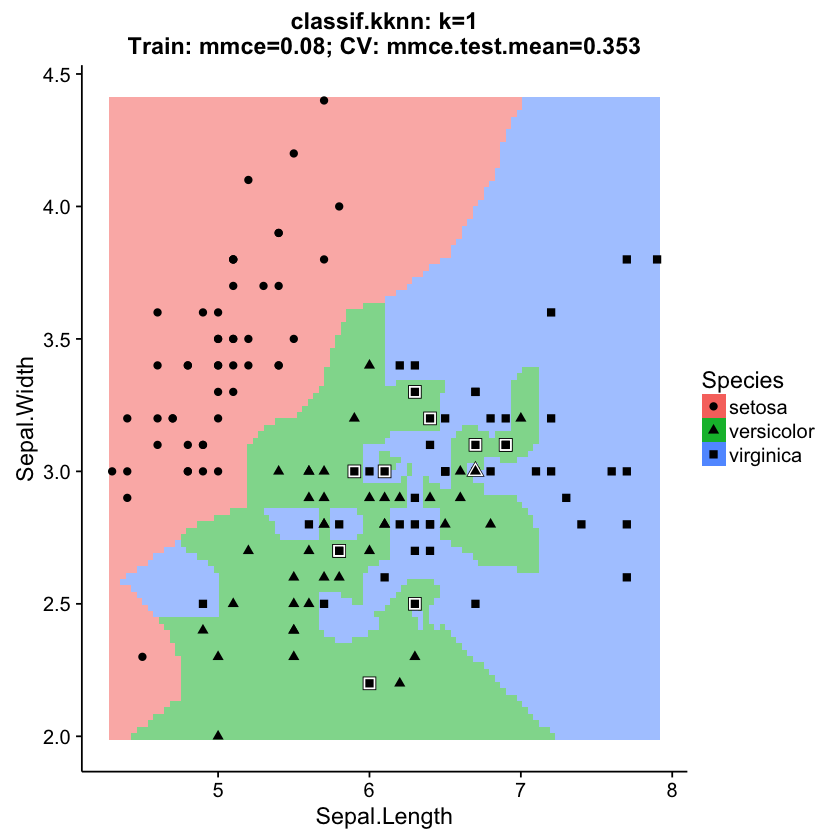

In [45]:
task = makeClassifTask(data = iris, target = "Species")
lrn = makeLearner("classif.kknn", k = 1)
plotLearnerPrediction(lrn, task, features = c("Sepal.Length", "Sepal.Width")) + theme_cowplot()

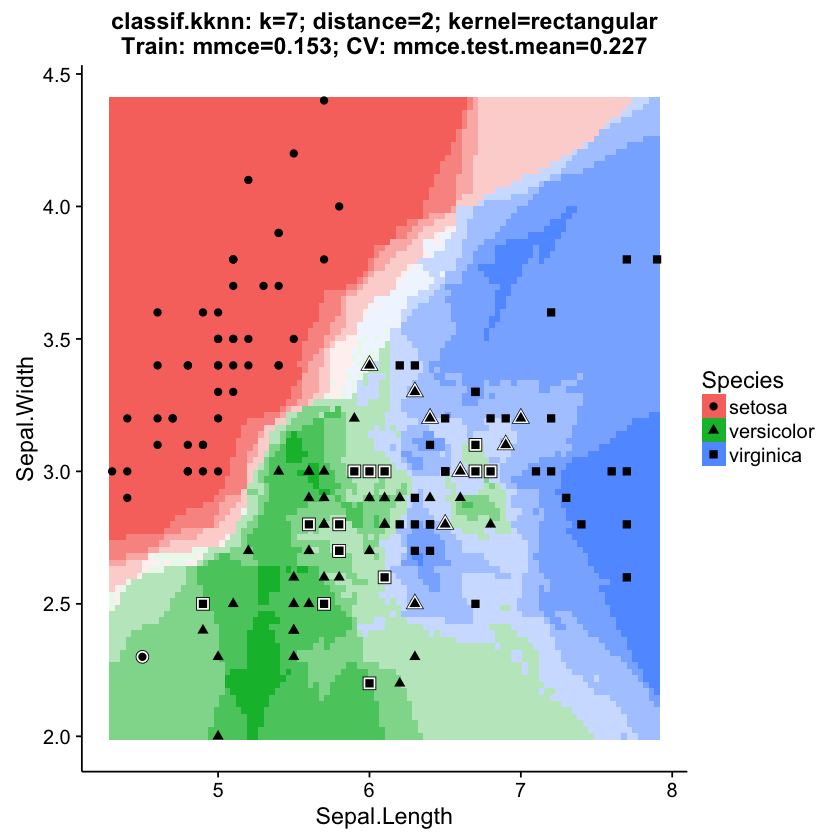

In [39]:
# k-Nearest Neighbor. Try changing the number of neighbors and study the effect
lrn = makeLearner("classif.kknn", par.vals = list(k = 7, distance = 2, kernel = "rectangular"))
plotLearnerPrediction(lrn, task, features = c("Sepal.Length", "Sepal.Width")) + theme_cowplot()

## Increasing $k$
- Reduces variance
    - small variations in the data points will have less effect because of neigbor's votes
    - decision boundaries become smoother
    - less overfitting
- Increases bias
    - some points (even if correct) are overpowered by their neighbors
    - more underfitting
- $k$ must be optimized empirically 

### Advantages
- Training is very fast
- Learn complex target functions easily
- Don't lose information

### Disadvantages
- Slow at query time
- Lots of storage needed
- Easily fooled by irrelevant attributes

## Distance measures
- Numeric features
    - Euclidean, Manhattan, $L^n$ norm
    - Normalized by: range, std. deviation
- Symbolic features
    - Hamming/overlap
    - Value difference measure (VDM)
$$ \delta(val_i,val_j) = \sum\limits_{h=1}^{classcount} | P(c_h|val_i) - P(c_h|val_j) |^n $$
- In general: domain-specific, encode knowledge

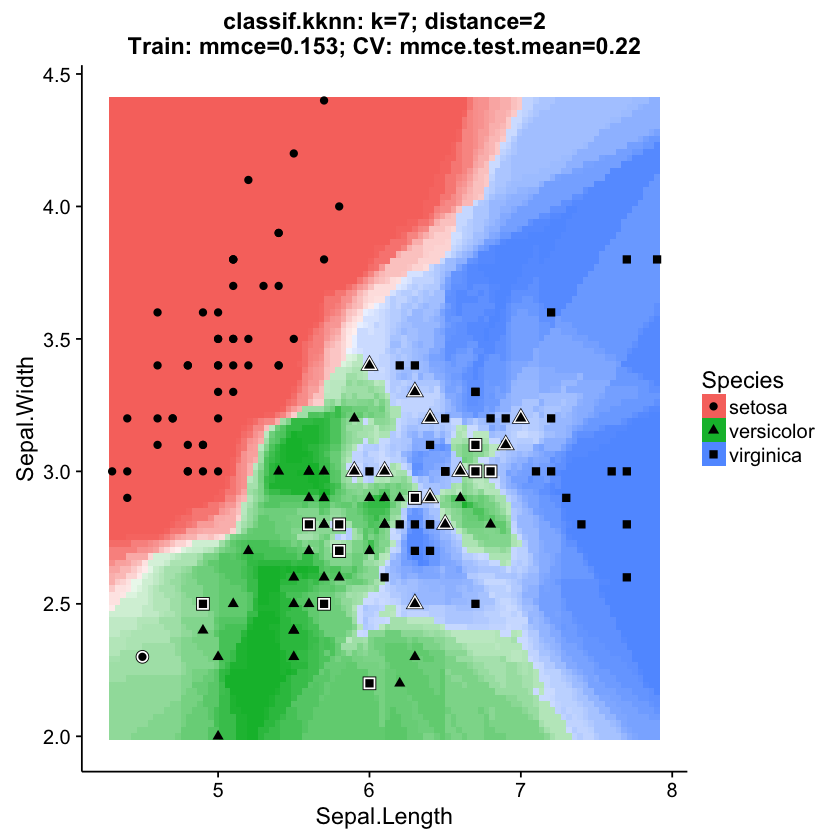

In [40]:
# The distance parameter allows you to change the distance measure (as the degree of the Minkowski distance)
lrn = makeLearner("classif.kknn", k = 7, distance = 2)
plotLearnerPrediction(lrn, task, features = c("Sepal.Length", "Sepal.Width")) + theme_cowplot()

## Distance-weighted kNN
- It may help to weight nearer neighbors more heavily, e.g.
$$\hat{f}(x_q) = \frac{\sum_{i=1}^k w_i f(x_i)}{\sum_{i=1}^k w_i}$$
with weight $w_i = \frac{1}{d(x_q,x_i)^2}$ and $d(x_q,x_i)$ the distance between $x_q$ and $x_i$
- We can now use all training examples instead of just k
    - No need to set k, but much more expensive to compute

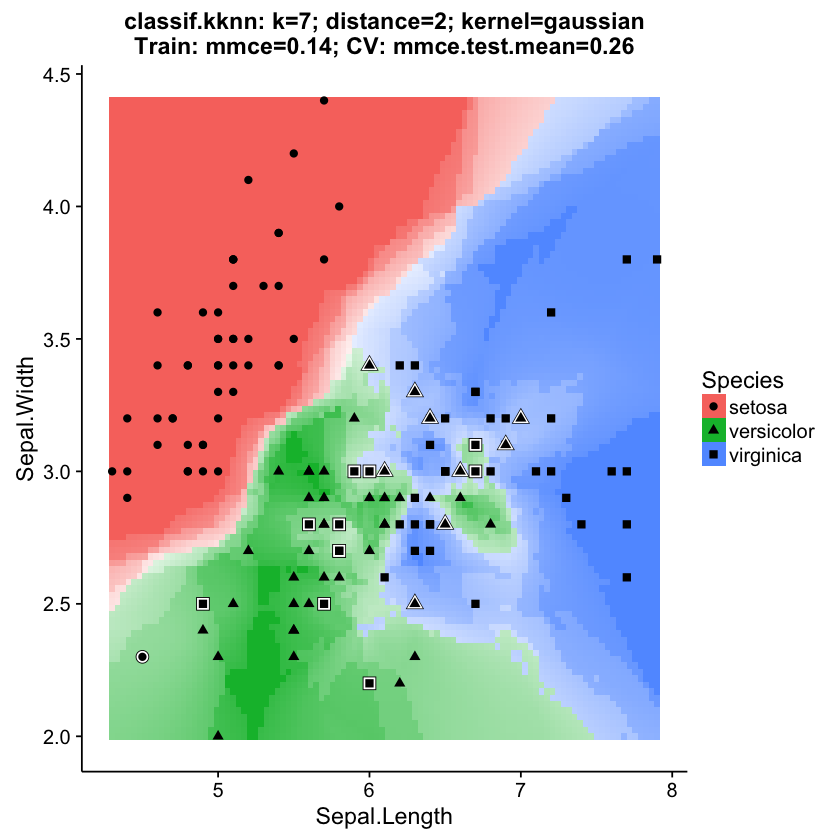

In [41]:
# Distance weighting is set by parameter 'kernel'. Rectangle = no weighting, Guassian = gaussian weights,...
lrn = makeLearner("classif.kknn", par.vals = list(k = 7, distance = 2, kernel = "gaussian"))
plotLearnerPrediction(lrn, task, features = c("Sepal.Length", "Sepal.Width")) + theme_cowplot()

## Curse of dimensionality
- Nearest neighbor (and most distance-based algorithms) will fail
    - Easily misled by non-relevant features
    - Even with many relevant features, the problem becomes harder
        - You need exponentially more data points with every new dimension
- Low dimensional intuitions don't apply in high dimension
    - Normal distribution: increasing chance that random samples fall in the tail
    - Uniformly distributed points in a hypercube increasingly near the faces
    - Ratio of volume of center vs outer shell of hypersphere becomes very small
    - ...
- Use feature selection whenever you deal with high dimensionality